<div style="background-color: #ccffcc; padding: 10px;">
    <h1> Tutorial 1 </h1> 
    <h2> Classification of Volcanic Deformation using Convolutional Neural Networks </h2>
</div>    

## Overview

This tutorial is based on work done by Matthew Gaddes and full code [VUDLNet_21](https://github.com/matthew-gaddes/VUDLNet_21)<sup>[1]</sup>. Creating a Convolutional Neural Network that will detect and localise deformation in Sentinel-1 Interferogram. A database of labelled Sentinel-1 data hosted at [VolcNet](https://github.com/matthew-gaddes/VolcNet) is used to train the CNN. 


A small subset of the data required is provided to create a tutorial that will both run in a short time frame and not be over file size limits set by GitHub. An option is included to download and use larger bottleneck files created from a larger data set to see a higher performance example. 

[1] [Matthew Gaddes, Andy Hooper , Fabien Albino 2021](https://eartharxiv.org/repository/view/1969/)

### Summary for non voclanologists

Interferograms are ground deformation maps produced by interferometric4synthetic aperture radar (InSAR). Specific deformation patterns are associated with different types of sources of deformation (volcanic activity). A trained person can, by eye, identify the source and location of deformation. However, when looking at a large number of interferograms automation is required.
<a href="https://www.usgs.gov/media/images/interferogram-period-april-6-june-2-2019">
<img src="https://prd-wret.s3.us-west-2.amazonaws.com/assets/palladium/production/s3fs-public/styles/full_width/public/thumbnails/image/image1-1417.png" width="500" height="600" alt="https://www.usgs.gov/center-news/volcano-watch-reading-rainbow-how-interpret-interferogram">
</a>

*taken from USGS*

<div style="background-color: #ccffcc; padding: 10px;">

<h1>Convolutional Neural Networks </h1>

This tutorial will use Convolutional Neural Networks to classify volcanic deformation.
 
## The very basics
    
If you know nothing about neural networks there is a [toy neural network python code example](https://github.com/cemac/LIFD_ENV_ML_NOTEBOOKS/tree/main/ToyNeuralNetwork) included in the [LIFD ENV ML Notebooks Repository]( https://github.com/cemac/LIFD_ENV_ML_NOTEBOOKS). Creating a 2 layer neural network to illustrate the fundamentals of how Neural Networks work and the equivlent code using the python machine learning library [keras](https://keras.io/). 
    
## Recommended reading 

The in-depth theory behind convolution neural networks will not be covered here as this tutorial is focusing on how to use them for a certain earth science application. If you wish to learn more here are some great starting points.     
    
1. [The very basics in a Victor Zhou Blog](https://victorzhou.com/blog/intro-to-cnns-part-1/)
2. [A deep dive into CNNs in towards data science](https://towardsdatascience.com/deep-dive-into-convolutional-networks-48db75969fdf)
3. [More information on transfer learning (using pre-trained models)](https://machinelearningmastery.com/how-to-use-transfer-learning-when-developing-convolutional-neural-network-models/)
4. [Section 5 of the example ipython notebooks from the fchollet deep learning with python repository](https://github.com/fchollet/deep-learning-with-python-notebooks)   
    
</div>



<hr>


<div style="background-color: #e6ccff; padding: 10px;">
    
<h1> Machine Learning Theory </h1>
<a href="https://towardsdatascience.com/deep-dive-into-convolutional-networks-48db75969fdf">
<img src="https://miro.medium.com/max/2510/1*XbuW8WuRrAY5pC4t-9DZAQ.jpeg">
</a>

 To create a convolutional neural network that both classify the type of deformation and the location a "two-headed model" is built to return both from one forward pass of an interferogram through the network. As models have already been trained to identify features it is possible to transfer weights from other models designed for different problems. In this tutorial, the VGG16 model is used as this was found to be sensitive to the signals of interest in interferograms.  
    
    
## Convolutional Neural Networks

A Neural Network is essentially a mathematical function that maps a given input to the desired output by adjusting weights and biases over many layers. 

![https://victorzhou.com/series/neural-networks-from-scratch/](https://victorzhou.com/media/nn-series/network.svg)
    
**Convolutional Neural Networks** (CCNs) are a popular variant of neural networks used for image classification. CNNs do not require as many weights as a normal neural network, they use the fact that each pixels neighbour provides some context to allow for localised features to be detected. CNN's use [convolutions](https://en.wikipedia.org/wiki/Convolution) to create a set of filters for each layer to create an output image by convolving a set of filters with the input image to create an output volume.
    
CNNs go through a set of steps.
    
1. Convolve the input image with a set of filters to create output volumes
2. Pool layers as much of the information contained in each layer's output is redundant as neighbouring pixels produce similar values. (This essentially reduces the output volume)
3. Create a [softmax layer](https://victorzhou.com/blog/softmax/) fully connected (dense) layer to predict the outcome with the highest probability.  
       
    
## VGG16 Model
    
Deep CCNs can take days or weeks to train if using very large datasets. This process can be shortened by re-using model weights from pre-trained models that were developed for standard computer vision benchmark datasets. i.e. some layers of a model trained on one problem that is similar to the actual problem that you're interested in can be used as a shortcut in training your model.  
    
The VGG16 model was developed by the [Visual Graphics Group (VGG) at Oxford](https://arxiv.org/abs/1409.1556) and works on recognising consistent and repeating structures. Here we will use 5 convolutional blocks of VGG16 on the input data before using a home built fully connected CNN. VGG16 is easily accessible via `Keras`.  
    
  
    
</div>    
  

  
<div style="background-color: #cce5ff; padding: 10px;">

<h1> Python </h1>

Basic python knowledge is assumed for this tutorial. A number of complex data processing and visualisation functions have been written and stored in aux_functions.py (code taken from [VUDLNet_21](https://github.com/matthew-gaddes/VUDLNet_21)). For this tutorial the main machine learning library we'll be working [Keras](https://keras.io/). Python specific information will be colour coded blue.
 
    
## Keras
    
There are many machine learning python libraries available, Keras is one such library although it now comes bundled with [TensorFlow](https://www.tensorflow.org/) and the recommendation is to use TensorFlow's Keras API instead of the standalone `Keras` package. Keras is a high-level API designed to make using a more low-level library like TensorFlow easier and more intuitive to use so you don't need to know about the hardware you're using or some of the more technical details of the models you're using. Throughout this tutorial, you will see some complex machine learning tasks executed in just a few lines of code by calling Keras functions.
</div>
    
<hr>

<div style="background-color: #ffffcc; padding: 10px;">
    
<h1> Requirements </h1>

These notebooks should run 

<h2> Python Packages: </h2>

* Python 3
* Keras
* tensorflow
* pydot
* graphviz
* ipdb
* matplotlib=3.0 
* basemap-data-hires
* geopy

<h2> Data Requirements</h2>
This notebook referes to some data included in the git hub repositroy
    
</div>


**Contents:**

1. [Load in real and Syntheric Data](#Load-In-Provided-Data)
2. [Augment Real Data](#Augment-Real-Data)
3. [Merge and rescale synthetic data](#Merge_and_Rescale)
4. [Compute bottleneck features.](#Compute_Bottleneck_features)
5. [Train fully connected network](#Train_CNN)
6. [Fine tune the fully connected network and the 5th convolutional block.](#Fine_Tunning) 


<div style="background-color: #cce5ff; padding: 10px;">
Load in all required modules (includig some auxillary code) and turn off warnings. Make sure Keras session is clear
</div>

In [1]:
# For readability: disable warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
# import modules
# general file system utilites
import sys
import glob
import os
from pathlib import Path
# Maths and 
import numpy as np
import numpy.ma as ma 
# Premade data is provided as pickles
import pickle
# Plotting utilies
import matplotlib
import matplotlib.pyplot as plt
import shutil
# Machine learning Library Keras
from tensorflow import keras 
#from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from tensorflow.keras import backend as K
from tensorflow.keras import losses, optimizers
from tensorflow.keras.applications.vgg16 import VGG16
from keras.utils.vis_utils import plot_model
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Dense, Dropout, Flatten
# import axillary plotting functions
# these functions 
from aux_functions import *

In [3]:
# Clear Keras session
K.clear_session()  



# Load In Provided Data 

<div style="background-color: #ccffcc; padding: 10px;">

    
The model will be trained on a large dataset of synthetic interferograms which feature labels of both the type and location of any deformation. The performance improved by including a small amount of augmented real Sentinel-1 data.

The first steps to prepare the data to have to be pre-made synthetic interferograms are provided in the `data` folder.

<h1> Sythetic Interferograms </h1>

As this is a tutorial focusing on Machine learning the Synthetic Interferograms are provided as pickle files. These files were genrated using [SyInteferoPy](https://github.com/matthew-gaddes/SyInterferoPy). [SyInteferoPy](https://github.com/matthew-gaddes/SyInterferoPy) generates synthetic images similar to those produced by Sentinel-1 satellites from the SRTM3 digital elevation model (DEM) <sup>[2]</sup>
   
[2] [Gaddes & Bagnardi 2019](https://agupubs.onlinelibrary.wiley.com/doi/abs/10.1029/2019JB017519)
  
</div>

<div style="background-color: #ffcdcc; padding: 10px;">    


If you wanted to generate your own synthetic data you would need to use the tools in [SyInteferoPy](https://github.com/matthew-gaddes/SyInterferoPy). [SyInteferoPy](https://github.com/matthew-gaddes/SyInterferoPy) and the pickled volcano dem data `data/volcano_dems.pkl`


    
```bash
 git submodule add https://github.com/matthew-gaddes/SyInterferoPy SyInterferoPy
 dependency_paths = {'syinterferopy_bin' : 'SyInterferoPy/lib/}
 sys.path.append(dependency_paths['syinterferopy_bin'])
 
```    
```python
from random_generation_functions import create_random_synthetic_ifgs  
os.mkdir(Path(f"./data/synthetic_data/"))
for file_n in range(synthetic_ifgs_n_files):
    print(f"Generating file {file_n} of {synthetic_ifgs_n_files} files.  ")
    X_all, Y_class, Y_loc, Y_source_kwargs = create_random_synthetic_ifgs(volcano_dems, 
                                                                **synthetic_ifgs_settings)
    # convert to one hot encoding (from class labels)
    Y_class = keras.utils.to_categorical(Y_class, len(synthetic_ifgs_settings['defo_sources']), 
                                                        dtype='float32')          
    with open(Path(f'./data/synthetic_data/data_file_{file_n}.pkl'), 'wb') as f:
        pickle.dump(X_all[synthetic_ifgs_settings['outputs'][0]], f)                                               
        pickle.dump(Y_class, f)
        pickle.dump(Y_loc, f)
    f.close()
    del X_all, Y_class, Y_loc
# output the settings as a text file so that we know how data were generated in the future.  
with open(f"./data/synthetic_data/synth_data_settings.txt", 'w') as f:       
    print(f"Number of data per file : {ifg_settings['n_per_file']}" ,file = f)
    print(f"Number of files: {synthetic_ifgs_n_files}" ,file = f)
    for key in synthetic_ifgs_settings:
        print(f"{key} : {synthetic_ifgs_settings[key]}", file = f)
```
    
</div>

<div style="background-color: #ffffcc; padding: 10px;">
    <h3>Settings for generating interfeorgrams.</h3>

Passing this information to [SyInteferoPy](https://github.com/matthew-gaddes/SyInterferoPy). [SyInteferoPy](https://github.com/matthew-gaddes/SyInterferoPy) will generate 650 synthetic Interfograms

* **n_per_file:** number of ifgs per data file.  
* **synthetic_ifgs_n_files:** numer of files of synthetic data
* **defo_sources:** deformation patterns that will be included in the dataset.  
* **n_ifgs:** the number of synthetic interferograms to generate PER FILE
* **n_pix:** number of 3 arc second pixels (~90m) in x and y direction
* **outputs:**  channel outputs.  uuu = unwrapped across all 3
* **intermediate_figure:**  if True, a figure showing the steps taken during creation of each ifg is displayed.  
* **cov_coh_scale:** The length scale of the incoherent areas, in meters.  A smaller value creates smaller patches, and a larger one creates larger pathces.  
* **coh_threshold:** if 1, there are no areas of incoherence, if 0 all of ifg is incoherent.  
* **min_deformation:** deformation pattern must have a signals of at least this many metres.  
* **max_deformation:** deformation pattern must have a signal no bigger than this many metres.  
* **snr_threshold signal:** to noise ratio (deformation vs turbulent and topo APS) to ensure that deformation is visible.  A lower value creates more subtle deformation signals.
* **turb_aps_mean:** turbulent APS will have, on average, a maximum strenghto this in metres (e.g 0.02 = 2cm)
* **turb_aps_length:** turbulent APS will be correlated on this length scale, in metres.  

</div>

In [4]:
# Define some settings (outlined above)
ifg_settings            = {'n_per_file'         : 50}    # number of ifgs per data file.  
synthetic_ifgs_n_files  =  13                            # numer of files of synthetic data
synthetic_ifgs_settings = {'defo_sources'       : ['dyke', 'sill', 'no_def'],  
                           'n_ifgs'             : ifg_settings['n_per_file'],  
                           'n_pix'              : 224,   
                           'outputs'            : ['uuu'],
                           'cov_coh_scale'      : 5000,  
                           'coh_threshold'      : 0.7,  
                           'min_deformation'    : 0.05,  
                           'max_deformation'    : 0.25,
                           'snr_threshold'      : 2.0, 
                           'turb_aps_mean'      : 0.02, 
                           'turb_aps_length'    : 5000} 
n_synth_data = ifg_settings['n_per_file'] * synthetic_ifgs_n_files
print('\nDetermining if files containing the synthetic deformation patterns exist...\n ', end = '')
synthetic_data_files = glob.glob(str(Path(f"./data/synthetic_data/*.pkl")))                 
if len(synthetic_data_files) == synthetic_ifgs_n_files:
    print(f"\nThe correct number of files were found ({synthetic_ifgs_n_files}) so no new ones will be generated.  "
          f"\nHowever, this doesn't guarantee that the files were made using the settings in synthetic_ifgs_settings." 
          f"\nCheck synth_data_settings.txt to be sure.   ")
else:
    print(f"\nCheck for pickles- do you have the data files required (in GitHub Repo)")


Determining if files containing the synthetic deformation patterns exist...
 
The correct number of files were found (13) so no new ones will be generated.  
However, this doesn't guarantee that the files were made using the settings in synthetic_ifgs_settings.
Check synth_data_settings.txt to be sure.   


<div style="background-color: #ccffcc; padding: 10px;">

<h1> Load in Real Data</h1>
Included in this repository is a git submodule [VolcNet](https://github.com/matthew-gaddes/VolcNet) which is a set of 250 labelled unwrapped interferograms that contain labels of both the type of deformation (including examples of no deformation) and the location of deformation within the interferograms. In the form of pickle files, i.e. interferograms have been stored as masked NumPy arrays and labelled with location and deformation source.
    
If you have not already then in your repositoy directory please run the following code. 
    
```bash
git submodule init
git submodule update --init --recursive
```

This labled data will be used to train our model.
    
</div>

<div style="background-color: #cce5ff; padding: 10px;">
The below code checks for the Volcnet files and uses plotting functions in the provided `aux_functions.py` to show the data.
    
For an example file it will show a plot of the interferrogram and give the lable of the deformation source (if applicable).

</div>

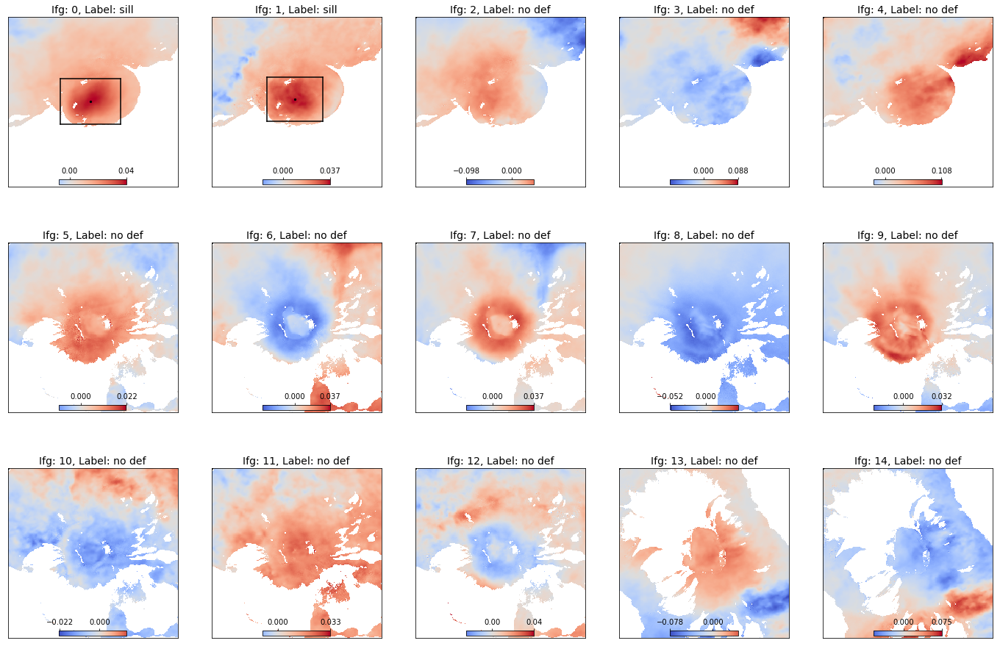

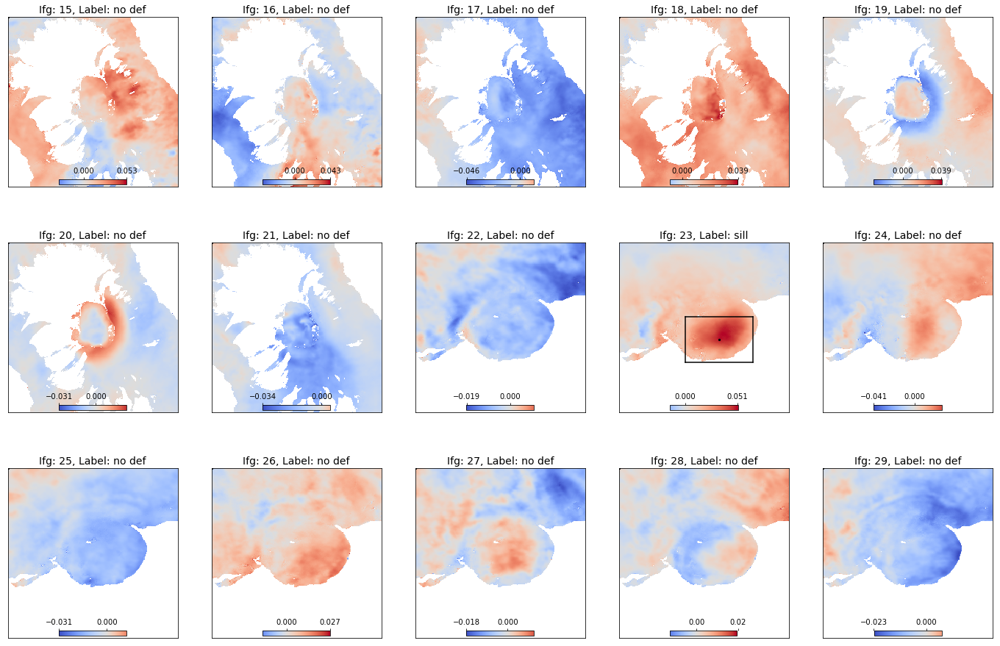

In [5]:
# Load the real data
# Note that these are in metres, and use one hot encoding for the class, 
# and are masked arrays (incoherence and water are masked)
VolcNet_path = Path('./VolcNet')
# factor to auument by.  E.g. if set to 3 and there are 250 data, there will be 650 augmented   
real_ifg_settings       = {'augmentation_factor' : 3}
#  get a list of the paths to all the VolcNet files
VolcNet_files = sorted(glob.glob(str(VolcNet_path / '*.pkl')))         
if len(VolcNet_files) == 0:
    raise Exception('No VolcNet files have been found.'  +
                    'Perhaps the path is wrong? Or perhaps you only want to use synthetic data?'+  
                    'In which case, this section can be removed.  Exiting...')

X_1s = []
Y_class_1s = []
Y_loc_1s = []
for VolcNet_file in VolcNet_files:
    X_1, Y_class_1, Y_loc_1 = open_VolcNet_file(VolcNet_file, synthetic_ifgs_settings['defo_sources'])
    X_1s.append(X_1)
    Y_class_1s.append(Y_class_1)
    Y_loc_1s.append(Y_loc_1)
X = ma.concatenate(X_1s, axis = 0)
Y_class = np.concatenate(Y_class_1s, axis = 0)
Y_loc = np.concatenate(Y_loc_1s, axis = 0)
del X_1s, Y_class_1s, Y_loc_1s, X_1, Y_class_1, Y_loc_1
# plot the data in it (note that this can be across multiople windows) 
plot_data_class_loc_caller(X[:30,], Y_class[:30,], Y_loc[:30,], source_names = ['dyke', 'sill', 'no def'], window_title = 'Sample of Real data')               


# Augment Real Data

<div style="background-color: #ccffcc; padding: 10px;">
    
To improve the performance of the model real data is incorporated. Because we can't include as much real data as the synthetic data we must 'augment' the data into the same size as the number of synthetic interferograms by creating random flips,  rotations,  and translations
    
</div>

<div style="background-color: #cce5ff; padding: 10px;">
As this augmentation is purely data manipulation we'll use some functions from `aux_functions.py` to help augment the set of 250 interferograms and generate a set of 650 augmented interferograms. The below code will generate pickle files of the augmented data that you can reuse so this step only needs to be done once.
    
<br>    
    
If you've already done this the below code will check if the pickles already exist and only calculated the augmented data if required
    
</div>

In [6]:
n_augmented_files = int((X.shape[0] * real_ifg_settings['augmentation_factor']) / ifg_settings['n_per_file'])                   # detemine how many files will be needed, given the agumentation factor.  
print('    Determining if files containing the augmented real data exist.')
real_augmented_files = glob.glob(str(Path(f"./data/real/augmented/*.pkl")))             #
if len(real_augmented_files) == n_augmented_files:
    print(f"    The correct number of augmented real data files were found ({n_augmented_files}) "
          f"so no new ones will be generated.  "
          f"However, this doesn't guarantee that the files were made using the current real data.  ")
else:
        try:
            shutil.rmtree(str(Path(f"./data/real/augmented/")))
        except:
            pass
        os.mkdir((Path(f"./data/real/")))
        os.mkdir((Path(f"./data/real/augmented/")))
        print(f"There are {X.shape[0]} real data and the augmentation factor is set" +
              f"to {real_ifg_settings['augmentation_factor']}.  ")
        print(f"    With {ifg_settings['n_per_file']} data per file, the nearest integer" + 
              f"number of files is {n_augmented_files}.  ")
        # loop through each file that is to be made
        for n_augmented_file in range(n_augmented_files):                                                                               
            print(f'    File {n_augmented_file} of {n_augmented_files}...', end = '')  
            X_sample, Y_class_sample, Y_loc_sample = choose_for_augmentation(X, Y_class, Y_loc,                                         # make a new selection of the data with balanced classes
                                                                              n_per_class = int(X.shape[0] / Y_class.shape[1]))          # set it so there are as many per class as there are (on average) for the real data.  
            X_aug, Y_class_aug, Y_loc_aug = augment_data(X_sample, Y_class_sample, Y_loc_sample,                                        # augment the sample of real data
                                                          n_data = ifg_settings['n_per_file'])                                           # make as many new data as are set to be in a single file.  
        
            with open(f"./data/real/augmented/data_file_{n_augmented_file}.pkl", 'wb') as f:                                        # save the output as a pickle
                pickle.dump(X_aug, f)
                pickle.dump(Y_class_aug, f)
                pickle.dump(Y_loc_aug, f)
            f.close()
            print('Done!')
        # fill variable with new generated files
        real_augmented_files = glob.glob(str(Path(f"./data/real/augmented/*.pkl")))  
        print('Done!')


    Determining if files containing the augmented real data exist.
    The correct number of augmented real data files were found (13) so no new ones will be generated.  However, this doesn't guarantee that the files were made using the current real data.  


<div style="background-color: #ccffcc; padding: 10px;">
<h1> Plot Augmented Data </h1>

Check the produced data looks sensible, this should look similar to our real data just different transformations
    
</div>

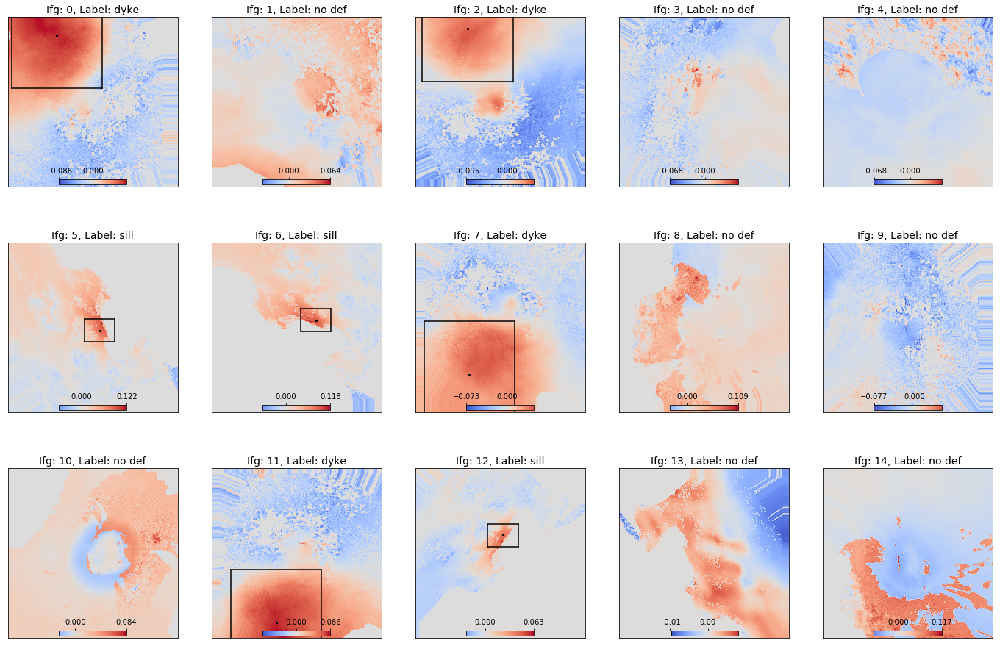

In [7]:
open_datafile_and_plot("./data/real/augmented/data_file_0.pkl", n_data = 15, window_title = '03 Sample of augmented real data')

<div style="background-color: #ccffcc; padding: 10px;">
<h1> Plot Synthetic Data </h1>

Check the Synthetic data looks sensible, this should also look similar to our real data!
</div>

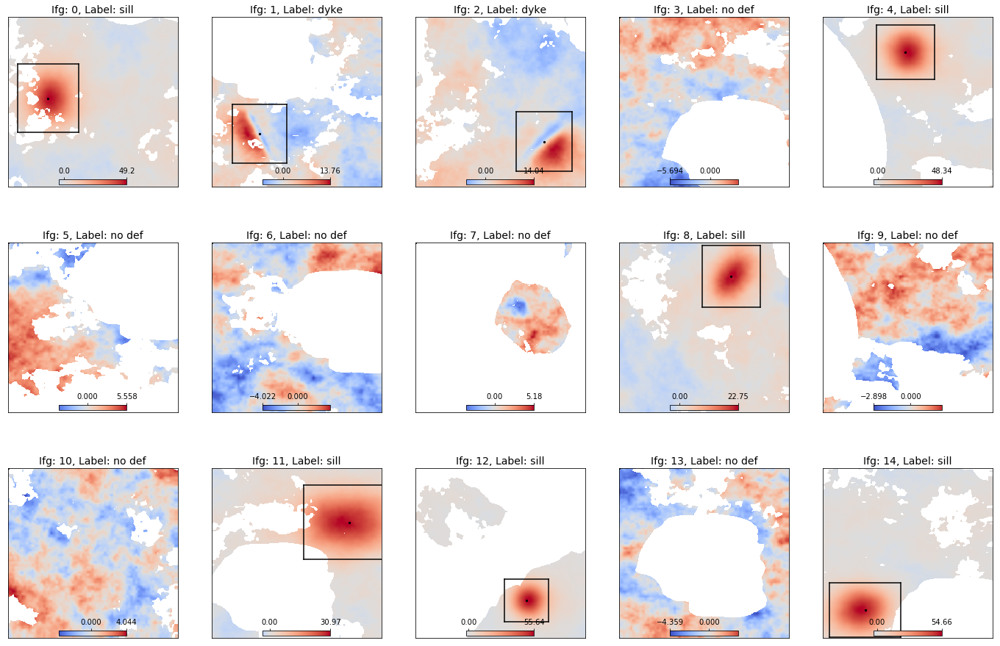

In [8]:
open_datafile_and_plot(f"data/synthetic_data/data_file_0.pkl", n_data = 15, 
                       window_title ='01 Sample of synthetic data')  # open and plot the data in 1 file

<div style="background-color: #ccffcc; padding: 10px;">

<h1> Merging real and synthetic inteferograms and rescaling to CCN's input range</h1>

First, we're going to merge our two datasets and format them into an output range suitable for the CNN used. E.g. our data might be in meters and rads and we need to rescale to values in the RGB range 0-255 (python's first indice is 0 so 0 -255 gives 256 values)

    
</div>

In [9]:
cnn_settings = {'input_range': {'min':0, 'max':255}}     

In [10]:
#%%
def merge_and_rescale_data(synthetic_data_files, real_data_files, output_range = {'min':0, 'max':225}):
    """ Given a list of synthetic data files and real data files (usually the augmented real data),
    
    Inputs:
        synthetic_data_files | list of Paths or string | locations of the .pkl files containing the masked arrays
        reak_data_files      | list of Paths or string | locations of the .pkl files containing the masked arrays
        output_range         | dict                    | min and maximum of each channel in each image. 
                                                         Should be set to suit the CNN being used.  
    Returns:
        .npz files in step_04_merged_rescaled_data
    History:
        2020_10_29 | MEG | Written
        2021_01_06 | MEG | Fix bug in that mixed but not rescaled data was being written to the numpy arrays.  
    """  
    def data_channel_checker(X, n_cols = None, window_title = None):
        """ Plot some of the data in X.   All three channels are shown.  
        """      
        if n_cols == None:       # if n_cols is None, we'll plot all the data
            n_cols = X.shape[0]   # so n_cols is the number of data
            plot_args = np.arange(0, n_cols) # and we'll be plotting each of them
        else:
            plot_args = np.random.randint(0, X.shape[0], n_cols)        # else, pick some at random to plot
        f, axes = plt.subplots(3,n_cols)
        if window_title is not None:
            f.canvas.set_window_title(window_title)
        for plot_n, im_n in enumerate(plot_args):                           # loop through each data (column)               
            axes[0, plot_n].set_title(f"Data: {im_n}")
            for channel_n in range(3):                                      # loop through each row
                axes[channel_n, plot_n].imshow(X[im_n, :,:,channel_n])
                if plot_n == 0:
                    axes[channel_n, plot_n].set_ylabel(f"Channel {channel_n}")

    if len(synthetic_data_files) != len(real_data_files):
        raise Exception('This funtion is only designed to be used when the number of real and synthetic data files are the same.  Exiting.  ')

    n_files = len(synthetic_data_files)        
    out_file = 0
    try:
            shutil.rmtree(str(Path(f"./data/merged_out/")))
    except:
        pass
    os.mkdir((Path(f"./data/merged_out")))# 
    for n_file in range(n_files):
        print(f'    Opening and merging file {n_file} of each type... ', end = '')
        with open(real_data_files[n_file], 'rb') as f:       # open the real data file
            X_real = pickle.load(f)
            Y_class_real = pickle.load(f)
            Y_loc_real = pickle.load(f)
        f.close()    
        
        with open(synthetic_data_files[n_file], 'rb') as f:       # open the synthetic data file
            X_synth = pickle.load(f)
            Y_class_synth = pickle.load(f)
            Y_loc_synth = pickle.load(f)
        f.close()    

        X = ma.concatenate((X_real, X_synth), axis = 0)        # concatenate the data
        Y_class = ma.concatenate((Y_class_real, Y_class_synth), axis = 0)    # and the class labels
        Y_loc = ma.concatenate((Y_loc_real, Y_loc_synth), axis = 0)        # and the location labels
        
        mix_index = np.arange(0, X.shape[0])          # mix them, get a lis of arguments for each data 
        np.random.shuffle(mix_index)            # shuffle the arguments
        X = X[mix_index,]               # reorder the data using the shuffled arguments
        Y_class = Y_class[mix_index]     # reorder the class labels
        Y_loc = Y_loc[mix_index]      # and the location labels
        # resacle the data from metres/rads etc. to desired input range of cnn (e.g. [0, 255]), 
        # and convert to numpy array
        X_rescale = custom_range_for_CNN(X, output_range, mean_centre = False)                  
        data_mid = int(X_rescale.shape[0] / 2)
        np.savez(f'data/merged_out/data_file_{out_file}.npz', 
                 X = X_rescale[:data_mid,:,:,:], 
                 Y_class= Y_class[:data_mid,:], 
                 Y_loc = Y_loc[:data_mid,:])           # save the first half of the data
        out_file += 1                                                                                                                                                   # after saving once, update
        np.savez(f'data/merged_out/data_file_{out_file}.npz', 
                 X = X_rescale[data_mid:,:,:,:], 
                 Y_class= Y_class[data_mid:,:],
                 Y_loc = Y_loc[data_mid:,:])           # save the second half of the data
        out_file += 1                                                                                                                                                   # and after saving again, update again.  
        print('Done.  ')
        
def expand_to_r4(r2_array, shape = (224,224)):
    """
    Calcaulte something for every image and channel in rank 4 data (e.g. 100x224x224x3 to get 100x3)
    Expand new rank 2 to size of original rank 4 for elemtiwise operations
    """
    
    r4_array = r2_array[:, np.newaxis, np.newaxis, :]
    r4_array = np.repeat(r4_array, shape[0], axis = 1)
    r4_array = np.repeat(r4_array, shape[1], axis = 2)
    return r4_array

def custom_range_for_CNN(r4_array, min_max, mean_centre = False):
    """ Rescale a rank 4 array so that each channel's image lies in custom range
    e.g. input with range of (-5, 15) is rescaled to (-125 125) or (-1 1) for use with VGG16.  
    Designed for use with masked arrays.  
    Inputs:
        r4_array | r4 masked array | works with masked arrays?  
        min_max | dict | 'min' and 'max' of range desired as a dictionary.  
        mean_centre | boolean | if True, each image's channels are mean centered.  
    Returns:
        r4_array | rank 4 numpy array | masked items are set to zero, rescaled so that each channel for each image lies between min_max limits.  
    History:
        2019/03/20 | now includes mean centering so doesn't stretch data to custom range.  
                    Instead only stretches until either min or max touches, whilst mean is kept at 0
        2020/11/02 | MEG | Update so range can have a min and max, and not just a range
        2021/01/06 | MEG | Upate to work with masked arrays.  Not test with normal arrays.
    """
    if mean_centre:
        # get the average for each image (in all thre channels)
        im_channel_means = ma.mean(r4_array, axis = (1,2)) 
        # expand to r4 so we can do elementwise manipulation
        im_channel_means = expand_to_r4(im_channel_means, r4_array[0,:,:,0].shape)          
        # do mean centering    
        r4_array -= im_channel_means                                                                        

    # get the minimum of each image and each of its channels    
    im_channel_min = ma.min(r4_array, axis = (1,2))
    # exapnd to rank 4 for elementwise applications
    im_channel_min = expand_to_r4(im_channel_min, r4_array[0,:,:,0].shape)
    # set so lowest channel for each image is 0
    r4_array -= im_channel_min                                                              
    # get the maximum of each image and each of its channels
    im_channel_max = ma.max(r4_array, axis = (1,2)) 
    # make suitable for elementwise applications
    im_channel_max = expand_to_r4(im_channel_max, r4_array[0,:,:,0].shape) 
    r4_array /= im_channel_max  # should now be in range [0, 1]
    
    r4_array *= (min_max['max'] - min_max['min'])    # should now be in range [0, new max-min]
    r4_array += min_max['min']                # and now in range [new min, new max]
    # convert to numpy array, maksed incoherent areas are set to zero.  
    r4_nparray = r4_array.filled(fill_value = 0)         
    return r4_nparray 



        

<div style="background-color: #ccffcc; padding: 10px;">

<h1> Plot the new reformatted data</h1>

The following cell calls the `merge_and_rescale` function and plots the output. You will notice these images still look similar to our original images just on a new scale. 

This might take a couple minutes.... 
    
</div>

    Opening and merging file 0 of each type... Done.  
    Opening and merging file 1 of each type... Done.  
    Opening and merging file 2 of each type... Done.  
    Opening and merging file 3 of each type... Done.  
    Opening and merging file 4 of each type... Done.  
    Opening and merging file 5 of each type... Done.  
    Opening and merging file 6 of each type... Done.  
    Opening and merging file 7 of each type... Done.  
    Opening and merging file 8 of each type... Done.  
    Opening and merging file 9 of each type... Done.  
    Opening and merging file 10 of each type... Done.  
    Opening and merging file 11 of each type... Done.  
    Opening and merging file 12 of each type... Done.  


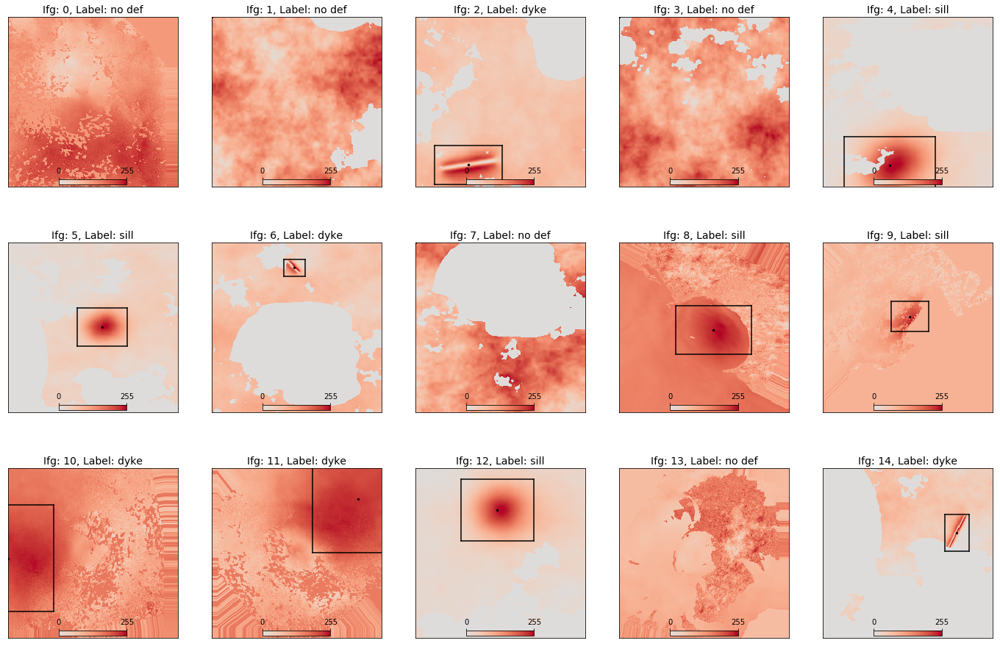

In [11]:
# get the paths to each file of real data
merge_and_rescale_data(synthetic_data_files, real_augmented_files, cnn_settings['input_range'])                                   # merge the real and synthetic data, and rescale it into the correct range for use with the CNN
open_datafile_and_plot("./data/merged_out/data_file_0.npz", n_data = 15,
                       window_title = ' 04 Sample of merged and rescaled data')

<hr>


<div style="background-color: #e6ccff; padding: 10px;">
    
<h1> Bottleneck Features </h1>
    
To train the model using different types of synthetic data, [bottleneck learning](https://towardsdatascience.com/a-comprehensive-hands-on-guide-to-transfer-learning-with-real-world-applications-in-deep-learning-212bf3b2f27a) is used. First, we compute the results from passing our entire dataset through the first five blocks of VGG16, before then training only the fully connected parts of our network (i.e.the classification output). 
    
    
<a href="https://eartharxiv.org/repository/view/1969/">
<img src="https://raw.githubusercontent.com/cemac/LIFD_ENV_ML_NOTEBOOKS/main/ConvolutionalNeuralNetworks/images/bottleneckgaddes2021.png" width="500" height="600" >
</a>

</div>    
  

<div style="background-color: #cce5ff; padding: 10px;">

this uses the Keras VGG16 module which if the machine you are using has GPU's will automatically use. The below code 

```python
    vgg16_block_1to5 = VGG16(weights='imagenet', include_top=False, input_shape = (224,224,3))
```
    
loads the first 5 convolutional blocks of VVG16 model trained for [imagenet](https://image-net.org/challenges/LSVRC/) and tells it our input interferograms will be in the shape 224 X 224 x 3
    
 ```python
    X_btln = vgg16_block_1to5.predict(X, verbose = 1)
  ```
 
will pass the data through the blocks to create a tensor of shape (7 x 7 x 512) 
    
<hr>
    
If the machine you are using does not have GPUS then 

    
The below segment of code may take a while if running on your laptop, if this is going to take too long then set
    
```python
UsePreMadeBottlenecks = True

```
</div>

In [12]:
UsePreMadeBottlenecks = False

In [13]:
# Compute bottleneck features):

# load the first 5 (convolutional) blocks of VGG16 and their weights.
vgg16_block_1to5 = VGG16(weights='imagenet', include_top=False, input_shape = (224,224,3))     

  
data_out_files = sorted(glob.glob(f'./data/merged_out/*.npz'))       

if UsePreMadeBottlenecks is False:
    try:
            shutil.rmtree(str(Path(f"./data/bottleneck_out/")))
    except:
        pass
    os.mkdir((Path(f"./data/bottleneck_out")))# 
    bottleneck_folder = 'bottleneck_out'
    # get a list of the files output by step 05 (augmented real data and synthetic data mixed and 
    # rescaed to correct range, with 0s for masked areas.  )
    for file_n, data_out_file in enumerate(data_out_files):   
        # loop through each of the step 05 files.  
        print(f'Bottlneck file {file_n}:') 
        data_out_file = Path(data_out_file)                                                                                     # convert to path 
        bottleneck_file_name = data_out_file.parts[-1].split('.')[0]                                                            # and get last part which is filename    
        data = np.load(data_out_file)                                                                                           # load the numpy file
        X = data['X']                                                                                                           # extract the data for it
        Y_class = data['Y_class']                                                                                               # and class labels.  
        Y_loc = data['Y_loc']                                                                                                   # and location labels.  
        X_btln = vgg16_block_1to5.predict(X, verbose = 1)      
        # predict up to bottleneck    
        np.savez(f'data/{bottleneck_folder}/{bottleneck_file_name}_bottleneck.npz', 
                 X = X_btln, Y_class = Y_class, Y_loc = Y_loc)   
        # save the bottleneck file, and the two types of label.
else:
    print('using premade bottleneck files')
    bottleneck_folder = 'bottleneck_provided'


Bottlneck file 0:
2/2 [==============================] - 1s 476ms/step
Bottlneck file 1:
2/2 [==============================] - 1s 475ms/step
Bottlneck file 2:
2/2 [==============================] - 1s 438ms/step
Bottlneck file 3:
2/2 [==============================] - 1s 428ms/step
Bottlneck file 4:
2/2 [==============================] - 1s 476ms/step
Bottlneck file 5:
2/2 [==============================] - 1s 431ms/step
Bottlneck file 6:
2/2 [==============================] - 1s 476ms/step
Bottlneck file 7:
2/2 [==============================] - 1s 434ms/step
Bottlneck file 8:
2/2 [==============================] - 1s 436ms/step
Bottlneck file 9:
2/2 [==============================] - 1s 418ms/step
Bottlneck file 10:
2/2 [==============================] - 1s 443ms/step
Bottlneck file 11:
2/2 [==============================] - 1s 443ms/step
Bottlneck file 12:
2/2 [==============================] - 1s 453ms/step
Bottlneck file 13:
2/2 [==============================] - 1s 434ms/step
Bo

<div style="background-color: #e6ccff; padding: 10px;">
    
<h1> Training the Neural Network </h1>

</div>    

<div style="background-color: #cce5ff; padding: 10px;">

 First, we need two functions to divide the list into a training and testing dataset. Two functions are written below to divide the data files and bottleneck files into testing and training datasets and to load various features into arrays in your computers RAM

```python
    

train_test_validate = file_list_divider(data_files, cnn_settings['n_files_train'], 
                                         cnn_settings['n_files_validate'], 
                                         cnn_settings['n_files_test']) 
# assign the outputs    
[data_files_train, data_files_validate, data_files_test] = train_test_validate 
```
    
creates a set of files to use for training, validation and testing based of perscibed CNN settings
    
</div>

In [14]:

def file_list_divider(file_list, n_files_train, n_files_validate, n_files_test):
    """ Given a list of files, divide it up into training, validating, and testing lists.  
    Inputs
        file_list | list | list of files
        n_files_train | int | Number of files to be used for training
        n_files_validate | int | Number of files to be used for validation (during training)
        n_files_test | int | Number of files to be used for testing
    Returns:
        file_list_train | list | list of training files
        file_list_validate | list | list of validation files
        file_list_test | list | list of testing files
    History:
        2019/??/?? | MEG | Written
        2020/11/02 | MEG | Write docs
        """
    file_list_train = file_list[:n_files_train]
    file_list_validate = file_list[n_files_train:(n_files_train+n_files_validate)]
    file_list_test = file_list[(n_files_train+n_files_validate) : (n_files_train+n_files_validate+n_files_test)]
    return file_list_train, file_list_validate, file_list_test

def file_merger(files): 
    """Given a list of files, open them and merge into one array.  
    Inputs:
        files | list | list of paths to the .npz files
    Returns
        X | r4 array | data
        Y_class | r2 array | class labels, ? x n_classes
        Y_loc | r2 array | locations of signals, ? x 4 (as x,y, width, heigh)
    History:
        2020/10/?? | MEG | Written
        2020/11/11 | MEG | Update to remove various input arguments
    
    """
    
    def open_synthetic_data_npz(name_with_path):
        """Open a file data file """  
        data = np.load(name_with_path)
        X = data['X']
        Y_class = data['Y_class']
        Y_loc = data['Y_loc']
        return X, Y_class, Y_loc

    n_files = len(files)
    for i, file in enumerate(files):
        X_batch, Y_class_batch, Y_loc_batch = open_synthetic_data_npz(file)
        if i == 0:
            n_data_per_file = X_batch.shape[0]
            # initate array, rank4 for image, get the size from the first file
            X = np.zeros((n_data_per_file * n_files, X_batch.shape[1], X_batch.shape[2], X_batch.shape[3]))
            # should be flexible with class labels or one hot encoding
            Y_class = np.zeros((n_data_per_file  * n_files, Y_class_batch.shape[1]))              
            Y_loc = np.zeros((n_data_per_file * n_files, 4))    # four columns for bounding box
            
        
        X[i*n_data_per_file:(i*n_data_per_file)+n_data_per_file,:,:,:] = X_batch
        Y_class[i*n_data_per_file:(i*n_data_per_file)+n_data_per_file,:] = Y_class_batch
        Y_loc[i*n_data_per_file:(i*n_data_per_file)+n_data_per_file,:] = Y_loc_batch
    
    return X, Y_class, Y_loc 

In [15]:
# Tain the fully connected part of the network)
cnn_settings = {'input_range'       : {'min':0, 'max':255}}
# the number of files that will be used to train the network
cnn_settings['n_files_train']     = 22      
# the number of files that wil be used to validate the network (i.e. passed through once per epoch)
cnn_settings['n_files_validate']  = 2       
# the number of files held back for testing. 
cnn_settings['n_files_test']      = 2       

In [16]:
data_files = sorted(glob.glob(f'./data/merged_out/*npz'), key = os.path.getmtime)    # make list of data files
# and make a list of bottleneck files (ie files that have been passed through the first 5 blocks of vgg16)
bottleneck_files = sorted(glob.glob('./data/'+str(bottleneck_folder)+'/'+f'*npz'), key = os.path.getmtime) 
if len(data_files) < (cnn_settings['n_files_train'] + cnn_settings['n_files_validate'] + cnn_settings['n_files_test']):
    raise Exception(f"There are {len(data_files)} data files, but {cnn_settings['n_files_train']} have been selected for training, "
                    f"{cnn_settings['n_files_validate']} for validation, and {cnn_settings['n_files_test']} for testing, "
                    f"which sums to greater than the number of data files.  Perhaps adjust the number of files used for the training stages? "
                    f"For now, exiting.")

data_files_train, data_files_validate, data_files_test = file_list_divider(data_files, 
                                                                           cnn_settings['n_files_train'], 
                                                                           cnn_settings['n_files_validate'], 
                                                                           cnn_settings['n_files_test'])                              # divide the files into train, validate and test
# also divide the bottleneck files
bottleneck_files_train, bottleneck_files_validate, bottleneck_files_test = file_list_divider(bottleneck_files, 
                                                                            cnn_settings['n_files_train'],
                                                                            cnn_settings['n_files_validate'], 
                                                                            cnn_settings['n_files_test'])      


# Open all the validation data to RAM
X_validate, Y_class_validate, Y_loc_validate      = file_merger(data_files_validate)                       
# Open the validation data bottleneck features to RAM
X_validate_btln, Y_class_validate, Y_loc_validate = file_merger(bottleneck_files_validate)     
# Open the test data to RAM
X_test, Y_class_test, Y_loc_test                  = file_merger(data_files_test)     
# Open the test data bottleneck features to RAM
X_test_btln, Y_class_test_btln, Y_loc_test_btln   = file_merger(bottleneck_files_test)  


print(f"    There are {len(data_files)} data files.  {len(data_files_train)} will be used for training,"    
      f"{len(data_files_validate)} for validation, and {len(data_files_test)} for testing.  ")

    There are 26 data files.  22 will be used for training,2 for validation, and 2 for testing.  


<div style="background-color: #e6ccff; padding: 10px;">
    
<h1> Define two headed model and training </h1>

The interferograms of shape (224×224×3) are passed through the five convolutional blocks of VGG16 to create a tensor of shape (7×7×512).  This is flattened to make a vector of size 25,088, before being passed through fully connected layers of size 256, 128, and an output layer of size three (i.e.,  dyke,  sill/point,  or no deformation). This is done in our `define_two_head_model` which takes the input from our VGG16 model to give our 3 class output.
    
```python
vgg16_block_1to5 = VGG16(weights='imagenet', include_top=False, input_shape = (224,224,3))       
```

we then need to make the input to the fully connected model the same shape as the output of the 5th block of vgg16 then build the full connected part of the model and get the two model outputs using the `define_two_head_model` function

```python
fc_model_input = Input(shape = vgg16_block_1to5.output_shape[1:])    
output_class, output_loc = define_two_head_model(fc_model_input, 
                                                 len(synthetic_ifgs_settings['defo_sources'])) 
``` 

to build our headed model

```python    
vgg16_2head_fc = Model(inputs=fc_model_input, outputs=[output_class, output_loc])                        
            
```
       
</div>    

In [17]:
def define_two_head_model(model_input, n_class_outputs = 3):
    """ Define the two headed model that we have designed to performed classification and localisation.  
    Inputs:
        model_input | tensorflow.python.framework.ops.Tensor | 
                      The shape of the tensor that will be input to our model. 
                      Usually the output of VGG16 (?x7x7x512)  Nb ? = batch size.  
        n_class_output | int | For a one hot encoding style output, there must be as many neurons as classes
    Returns:
        output_class |tensorflow.python.framework.ops.Tensor | 
                      The shape of the tensor output by the classifiction head.  Usually ?x3
        output_loc | tensorflow.python.framework.ops.Tensor | 
                     The shape of the tensor output by the localisation head.  Usually ?x4
    History:
        2020_11_11 | MEG | Written
    """    
    vgg16_block_1to5_flat = Flatten(name = 'vgg16_block_1to5_flat')(model_input)  
    # flatten the model input (ie deep representation turned into a column vector)
    # 1: the clasification head
    x = Dropout(0.2, name='class_dropout1')(vgg16_block_1to5_flat)
    # add a fully connected layer
    x = Dense(256, activation='relu', name='class_dense1')(x)                                                 
    x = Dropout(0.2, name='class_dropout2')(x)
    # add a fully connected layer
    x = Dense(128, activation='relu', name='class_dense2')(x)                                                
    # and an ouput layer with 7 outputs (ie one per label)
    output_class = Dense(n_class_outputs, activation='softmax',  name = 'class_dense3')(x)                 
    
    
    # 2: the localization head
    x = Dense(2048, activation='relu', name='loc_dense1')(vgg16_block_1to5_flat) 
    # add a fully connected layer
    x = Dense(1024, activation='relu', name='loc_dense2')(x)                                                
    # add a fully connected layer
    x = Dense(1024, activation='relu', name='loc_dense3')(x)                                                
    x = Dropout(0.2, name='loc_dropout1')(x)
    # add a fully connected layer
    x = Dense(512, activation='relu', name='loc_dense4')(x)                                                 
    # add a fully connected layer
    x = Dense(128, activation='relu', name='loc_dense5')(x)                                                 
    output_loc = Dense(4, name='loc_dense6')(x)        
    
    return output_class, output_loc

In [18]:
# Define, compile, and train the model
# VGG16 is used for its convolutional layers and weights (but no fully connected part as we define out own )
vgg16_block_1to5 = VGG16(weights='imagenet', include_top=False, input_shape = (224,224,3))       
# the input to the fully connected model must be the same shape as the output of the 5th block of vgg16
fc_model_input = Input(shape = vgg16_block_1to5.output_shape[1:])               
# build the full connected part of the model, and get the two model outputs
output_class, output_loc = define_two_head_model(fc_model_input, len(synthetic_ifgs_settings['defo_sources']))  
# define the model.  Input is the shape of vgg16 block 1 to 5 output, and there are two outputs (hence list)
vgg16_2head_fc = Model(inputs=fc_model_input, outputs=[output_class, output_loc])                        
            

<div style="background-color: #ccffcc; padding: 10px;">

<h1> Plot model</h1>

**Note** Graphviz might not work on all systems, the code below will provide an alternative solution if graphviz fails    
</div>

In [19]:
try:
    os.mkdir((Path(f"./data/train_fully_connected_model")))
except:
    pass
try:
    plot_model(vgg16_2head_fc, to_file=f'data/train_fully_connected_model/vgg16_2head_fc.png',            
           # also plot the model.  This funtcion is known to be fragile due to Graphviz dependencies.  
           show_shapes = True, show_layer_names = True)
except:
    vgg16_2head_fc.summary()

<div style="background-color: #e6ccff; padding: 10px;">
    
<h1> Define two headed model and training </h1>

Now we can compile the model passing in some optimizations: the standard [Adam gradient-based optimizer](https://arxiv.org/abs/1412.6980) and the [loss functions](https://keras.io/api/losses/) ( Cross-Entropy loss as Softmax is to be used) and request the accuracy metric to be reported 

```python
vgg16_2head_fc.compile(optimizer = opt_used, loss=[loss_class, loss_loc], 
                       # compile the model
                       loss_weights = fc_loss_weights, metrics=['accuracy'])  
```

And write a function to train out double-headed model

```python
train_double_network(vgg16_2head_fc,  bottleneck_files_train,n_epochs_fc, 
                     ['class_dense3_loss','loc_dense6_loss'], Xvalidate_btln, 
                     Y_class_validate, Y_loc_validate,
                     len(synthetic_ifgs_settings['defo_sources']))
```

which takes our compiled model `vgg16_2head_fc` and our subset of bottleneck files  and trains over a number of 
"epochs" here set to 10 for speed rather than accuracy. 
    
<hr>
    
Training the model may take a few minutes ...

In [20]:
def train_double_network(model, files, n_epochs, loss_names,
                                    X_validate, Y_class_validate, Y_loc_validate, n_classes):
    """Train a double headed model using training data stored in separate files.  
    Inputs:
        model | keras model | the model to be trained
        files | list | list of paths and filenames for the files used during training
        n_epochs | int | number of epochs to train for
        loss names | list | names of outputs of losses (e.g. "class_dense3_loss)
    Returns
        model | keras model | updated by the fit process
        metrics_loss | r2 array | columns are: total loss/class loss/loc loss /validate total loss/validate 
                                               class loss/ validate loc loss
        metrics_class | r2 array | columns are class accuracy, validation class accuracy
        
    2019/03/25 | Written.  
    """  
    n_files_train = len(files)          # get the number of training files
    
    metrics_class = np.zeros((n_files_train*n_epochs, 2))   # train class acuracy, valiate class accuracy
    # total loss/class loss/loc loss /validate total loss/validate class loss/ validate loc loss
    metrics_loss = np.zeros((n_files_train*n_epochs, 6))     
    for e in range(n_epochs):     # loop through the number of epochs
        for file_num, file in enumerate(files):    # for each epoch, loop through all files once
        
            data = np.load(file)
            X_batch = data['X']
            Y_batch_class = data['Y_class']
            Y_batch_loc = data['Y_loc']
            
            if n_classes !=  Y_batch_class.shape[1]:
                # convert to one hot encoding (from class labels)
                Y_batch_class = keras.utils.to_categorical(Y_batch_class, n_classes, dtype='float32')                     

            history_train_temp = model.fit(X_batch, [Y_batch_class, Y_batch_loc], batch_size=32,
                                           epochs=1, verbose = 0)
            # main loss   
            metrics_loss[(e*n_files_train)+file_num, 0] = history_train_temp.history['loss'][0]   
            # class loss
            metrics_loss[(e*n_files_train)+file_num, 1] = history_train_temp.history[loss_names[0]][0]
            # localization loss
            metrics_loss[(e*n_files_train)+file_num, 2] = history_train_temp.history[loss_names[1]][0]   
            metrics_class[(e*n_files_train)+file_num, 0] = history_train_temp.history['class_dense3_accuracy'][0]           # classification accuracy        
            print(f'Epoch {e}, file {file_num}: Loss = {round(metrics_loss[(e*n_files_train)+file_num, 0],0)}, '
                                       f'Class. loss = {round(metrics_loss[(e*n_files_train)+file_num, 1],2)}, '
                                       f'Class. acc. = {round(metrics_class[(e*n_files_train)+file_num, 0],2)}, '
                                         f'Loc. loss = {round(metrics_loss[(e*n_files_train)+file_num, 2],0)}')
            
            
            
            
        history_validate_temp = model.evaluate(X_validate, [Y_class_validate, Y_loc_validate], 
                                               batch_size = 32, verbose = 0)
        metrics_loss[(e*n_files_train)+file_num, 3] = history_validate_temp[0]     # main loss
        metrics_loss[(e*n_files_train)+file_num, 4] = history_validate_temp[1]     # class loss
        metrics_loss[(e*n_files_train)+file_num, 5] = history_validate_temp[2]     # localisation loss
        metrics_class[(e*n_files_train)+file_num, 1] = history_validate_temp[3]    # classification  accuracy
        print(f'Epoch {e}, valid.: Loss = {round(metrics_loss[(e*n_files_train)+file_num, 3],0)}, '
                          f'Class. loss = {round(metrics_loss[(e*n_files_train)+file_num, 4],2)}, '
                          f'Class. acc. = {round(metrics_class[(e*n_files_train)+file_num, 1],2)}, '
                            f'Loc. loss = {round(metrics_loss[(e*n_files_train)+file_num, 5],0)}')
    
    # class loss, validate class loss, class accuracy, validate class accuracy
    metrics_class = np.hstack((metrics_loss[:,1:2], metrics_loss[:,4:5], metrics_class ))     
    # localisation loss, validate localisation loss, localisation accuracy, validate localisation accuracy
    metrics_localisation = np.hstack((metrics_loss[:,2:3], metrics_loss[:,5:]))                        
    # class accuracy, validate class accuracy
    metrics_combined_loss = np.hstack((metrics_loss[:,1:2], metrics_loss[:,3:4]))         
    return model, metrics_class, metrics_localisation, metrics_combined_loss

In [21]:
# the relative weighting of the two losses (classificaiton and localisation) 
# to contribute to the global loss.  Classification first, localisation second. 
fc_loss_weights = [0.05, 0.95]              
# the number of epochs to train the fully connected network for 
# (ie. the number of times all the training data are passed through the model)
n_epochs_fc = 10   

In [22]:
# good loss to use for classification problems, may need to switch to binary if only two classes though?
loss_class = losses.categorical_crossentropy     
# loss for localisation
loss_loc = losses.mean_squared_error       
# adam with Nesterov accelerated gradient
opt_used = optimizers.Nadam(clipnorm = 1., clipvalue = 0.5)  
# accuracy is useful to have on the terminal during training
vgg16_2head_fc.compile(optimizer = opt_used, loss=[loss_class, loss_loc], 
                       # compile the model
                       loss_weights = fc_loss_weights, metrics=['accuracy'])    


[vgg16_2head_fc,  metrics_class_fc, 
 metrics_localisation_fc, metrics_combined_loss_fc ] = train_double_network(vgg16_2head_fc, 
                                                                            bottleneck_files_train,
                                                                            n_epochs_fc, 
                                                                            ['class_dense3_loss', 
                                                                             'loc_dense6_loss'],
                                                                            X_validate_btln, 
                                                                            Y_class_validate, 
                                                                            Y_loc_validate,
                                                                len(synthetic_ifgs_settings['defo_sources']))

Epoch 0, file 0: Loss = 7799.0, Class. loss = 18.92, Class. acc. = 0.46, Loc. loss = 8209.0
Epoch 0, file 1: Loss = 8778.0, Class. loss = 8.23, Class. acc. = 0.42, Loc. loss = 9239.0
Epoch 0, file 2: Loss = 6615.0, Class. loss = 6.83, Class. acc. = 0.32, Loc. loss = 6962.0
Epoch 0, file 3: Loss = 4257.0, Class. loss = 4.09, Class. acc. = 0.52, Loc. loss = 4481.0
Epoch 0, file 4: Loss = 4445.0, Class. loss = 4.43, Class. acc. = 0.44, Loc. loss = 4678.0
Epoch 0, file 5: Loss = 4287.0, Class. loss = 4.69, Class. acc. = 0.5, Loc. loss = 4512.0
Epoch 0, file 6: Loss = 3890.0, Class. loss = 4.34, Class. acc. = 0.5, Loc. loss = 4094.0
Epoch 0, file 7: Loss = 3726.0, Class. loss = 1.63, Class. acc. = 0.64, Loc. loss = 3922.0
Epoch 0, file 8: Loss = 3549.0, Class. loss = 4.89, Class. acc. = 0.44, Loc. loss = 3736.0
Epoch 0, file 9: Loss = 3123.0, Class. loss = 1.51, Class. acc. = 0.62, Loc. loss = 3288.0
Epoch 0, file 10: Loss = 4023.0, Class. loss = 1.76, Class. acc. = 0.62, Loc. loss = 4234.0

Epoch 3, valid.: Loss = 1329.0, Class. loss = 0.87, Class. acc. = 0.84, Loc. loss = 1399.0
Epoch 4, file 0: Loss = 1251.0, Class. loss = 1.03, Class. acc. = 0.88, Loc. loss = 1317.0
Epoch 4, file 1: Loss = 806.0, Class. loss = 0.43, Class. acc. = 0.96, Loc. loss = 848.0
Epoch 4, file 2: Loss = 634.0, Class. loss = 0.22, Class. acc. = 0.96, Loc. loss = 668.0
Epoch 4, file 3: Loss = 760.0, Class. loss = 0.07, Class. acc. = 0.98, Loc. loss = 800.0
Epoch 4, file 4: Loss = 777.0, Class. loss = 0.38, Class. acc. = 0.94, Loc. loss = 818.0
Epoch 4, file 5: Loss = 859.0, Class. loss = 0.49, Class. acc. = 0.94, Loc. loss = 904.0
Epoch 4, file 6: Loss = 650.0, Class. loss = 0.45, Class. acc. = 0.9, Loc. loss = 684.0
Epoch 4, file 7: Loss = 483.0, Class. loss = 0.16, Class. acc. = 0.98, Loc. loss = 508.0
Epoch 4, file 8: Loss = 1154.0, Class. loss = 0.32, Class. acc. = 0.92, Loc. loss = 1214.0
Epoch 4, file 9: Loss = 504.0, Class. loss = 0.74, Class. acc. = 0.86, Loc. loss = 531.0
Epoch 4, file 10

Epoch 7, valid.: Loss = 719.0, Class. loss = 1.2, Class. acc. = 0.82, Loc. loss = 757.0
Epoch 8, file 0: Loss = 338.0, Class. loss = 0.21, Class. acc. = 0.98, Loc. loss = 356.0
Epoch 8, file 1: Loss = 450.0, Class. loss = 0.1, Class. acc. = 0.98, Loc. loss = 474.0
Epoch 8, file 2: Loss = 314.0, Class. loss = 0.0, Class. acc. = 1.0, Loc. loss = 330.0
Epoch 8, file 3: Loss = 431.0, Class. loss = 0.35, Class. acc. = 0.96, Loc. loss = 454.0
Epoch 8, file 4: Loss = 332.0, Class. loss = 0.8, Class. acc. = 0.96, Loc. loss = 349.0
Epoch 8, file 5: Loss = 304.0, Class. loss = 0.08, Class. acc. = 0.98, Loc. loss = 320.0
Epoch 8, file 6: Loss = 376.0, Class. loss = 0.15, Class. acc. = 0.96, Loc. loss = 396.0
Epoch 8, file 7: Loss = 301.0, Class. loss = 0.1, Class. acc. = 0.98, Loc. loss = 316.0
Epoch 8, file 8: Loss = 402.0, Class. loss = 0.72, Class. acc. = 0.92, Loc. loss = 424.0
Epoch 8, file 9: Loss = 385.0, Class. loss = 0.04, Class. acc. = 0.98, Loc. loss = 405.0
Epoch 8, file 10: Loss = 36

<div style="background-color: #ccffcc; padding: 10px;">

<h1> Plot the training history and  Test the model </h1>

`custom_training_history` takes the output metics (accuracy) and plots for classification and localisation so we can see how the accuracy improved over epochs

```python
Y_class_test_cnn, Y_loc_test_cnn = vgg16_2head_fc.predict(X_test_btln, verbose = 1)  
```
Generates the prediction labels which are given to our plotting function `plot_data_class_loc_caller`
    
To show actual and predicted classification and localisation of deformation from the interferograms.
    
</div>

In [23]:
def custom_training_history(metrics, n_epochs, title = None):
    """Plot training line graphs for loss and accuracy.  Loss on the left, accuracy on the right.  
    Inputs
        metrics | r2 array | (n_files * n_epochs) x 2 or 4 matrix,  train loss|validate loss | 
        train accuracy|validate accuracy. 
        If no accuracy, only 2 columns
        n_epochs | int | number of epochs model was trained for
        title | string | title
    Returns:
        Figure
    """
   
    
    if metrics.shape[1] == 4:        # detemrine if we have accuracy as well as loss
        accuracy_flag = True
    else:
        accuracy_flag = False
        
    
    n_files = metrics.shape[0] / n_epochs
    # Figure output
    fig1, axes = plt.subplots(1,2)
    fig1.canvas.set_window_title(title)
    fig1.suptitle(title)
    xvals = np.arange(0,metrics.shape[0])
    # fewer validation data; find which ones to plot
    validation_plot = np.ravel(np.argwhere(metrics[:,1] > 1e-10))                       
    axes[0].plot(xvals, metrics[:,0], c = 'k')                                       # training loss
    axes[0].plot(xvals[validation_plot], metrics[validation_plot,1], c = 'r')        # validation loss
    axes[0].set_ylabel('Loss')
    axes[0].legend(['train', 'validate'], loc='upper left')
    axes[0].axhline(y=0, color='k', alpha=0.5)
    
    if accuracy_flag:
        axes[1].plot(xvals, metrics[:,2], c = 'k')                                       # training accuracy
        axes[1].plot(xvals[validation_plot], metrics[validation_plot,3], c = 'r')        # validation accuracy
        axes[1].set_ylim([0,1])
        axes[1].set_ylabel('Accuracy')
        axes[1].yaxis.tick_right()
        axes[1].legend(['train', 'validate'], loc='upper right')
        
    #
    titles = ['Training loss', 'Training accuracy']
    for i in range(2):
        axes[i].set_title(titles[i])
        # change so a tick only after each epoch (and not each file)
        axes[i].set_xticks(np.arange(0,metrics.shape[0],2*n_files))     
        axes[i].set_xticklabels(np.arange(0,n_epochs, 2))   # number ticks
        axes[i].set_xlabel('Epoch number')

    if not accuracy_flag:
        axes[1].set_visible(False)

4/4 [==============================] - 0s 65ms/step


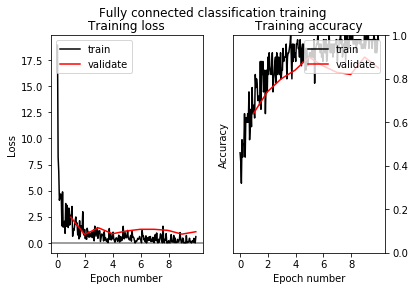

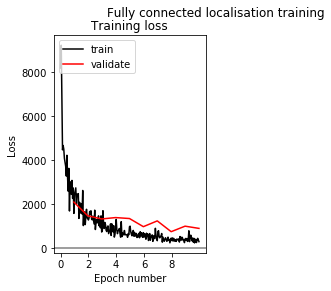

In [24]:
# plot of the training process for classification
custom_training_history(metrics_class_fc, n_epochs_fc, title = 'Fully connected classification training')       
# plot of the training process for localisation
custom_training_history(metrics_localisation_fc, n_epochs_fc, title = 'Fully connected localisation training')   
# save the weights of the model we have trained
vgg16_2head_fc.save_weights(f'data/train_fully_connected_model/vgg16_2head_fc.h5')   


# Test the model
# forward pass of the testing data bottleneck features through the fully connected part of the model
Y_class_test_cnn, Y_loc_test_cnn = vgg16_2head_fc.predict(X_test_btln, verbose = 1)                           

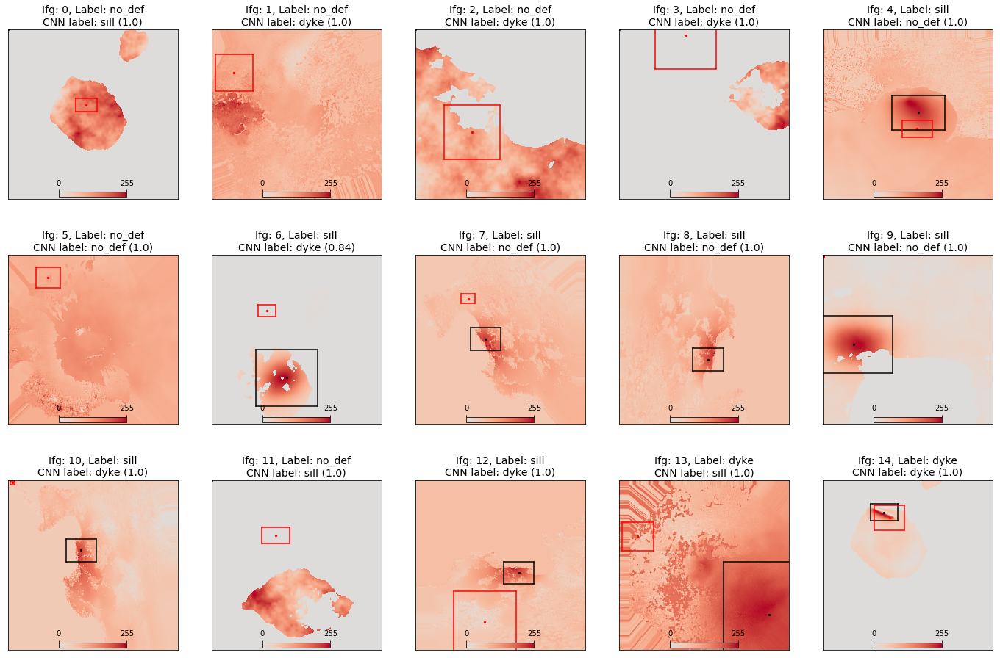

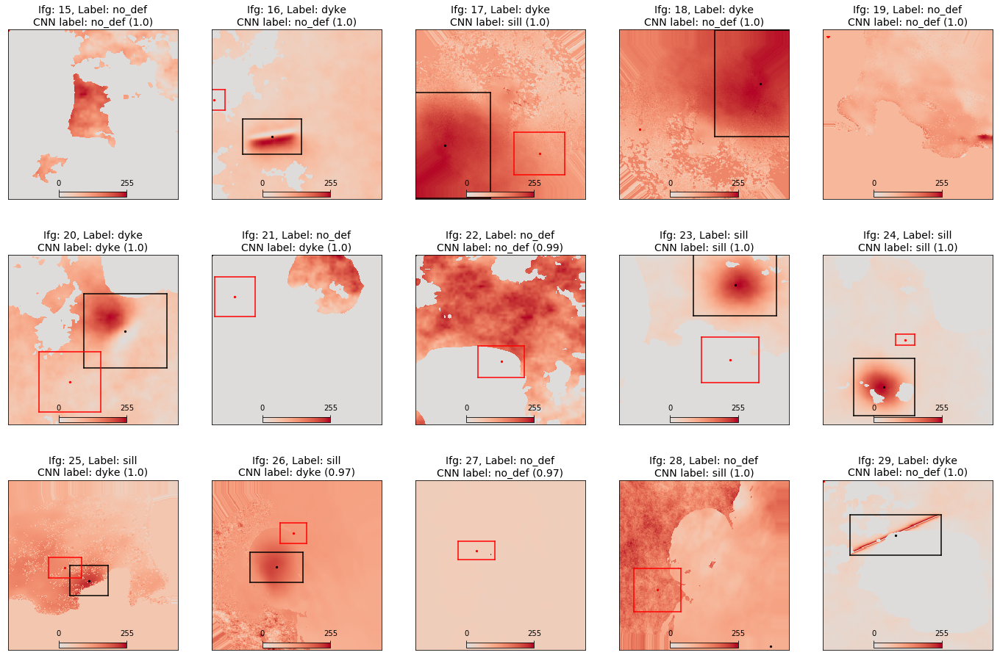

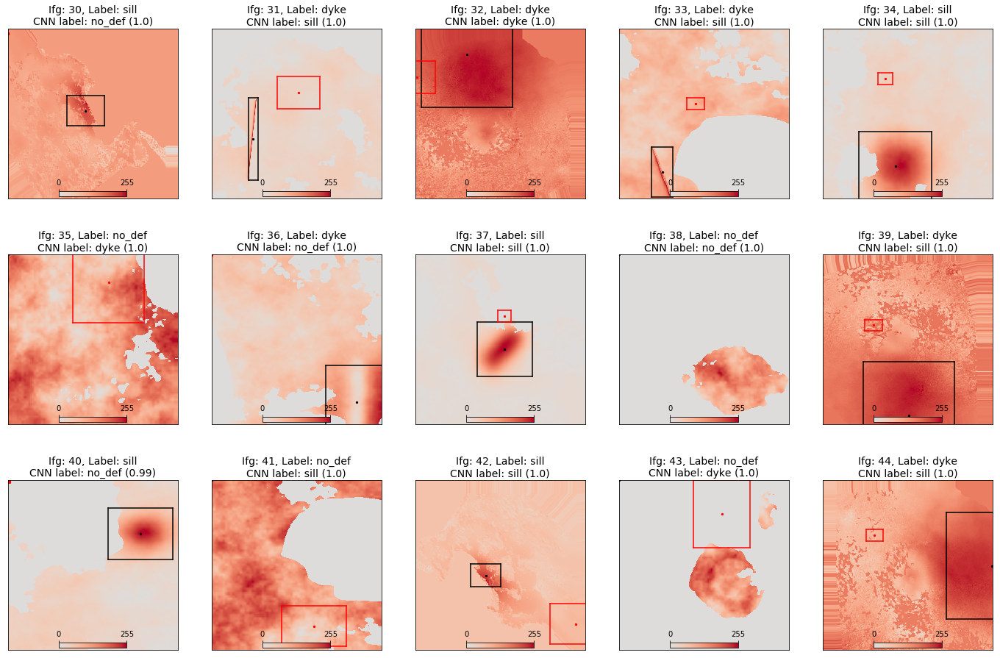

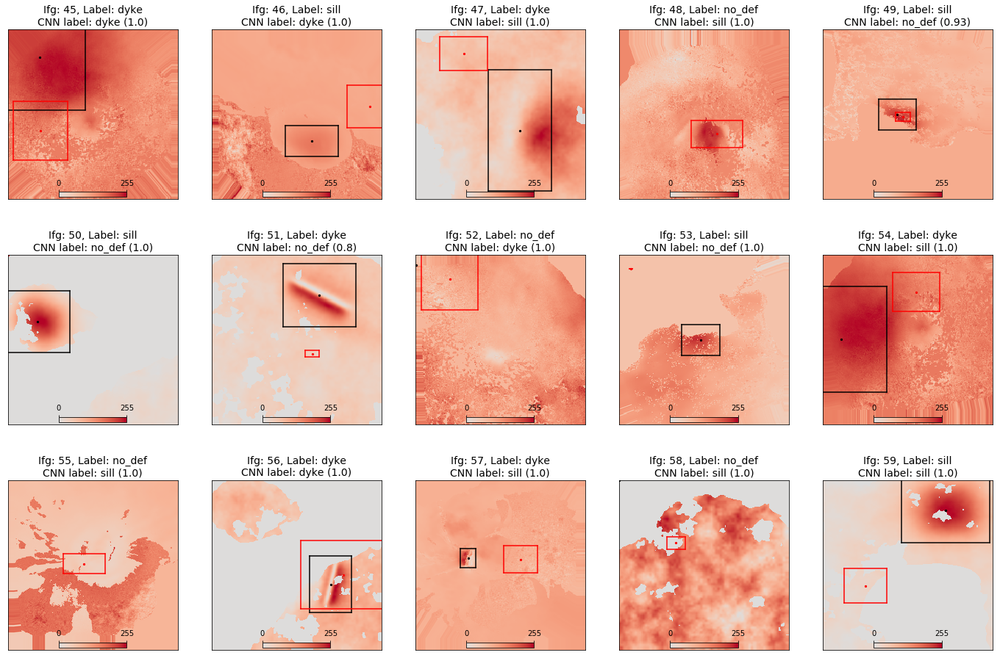

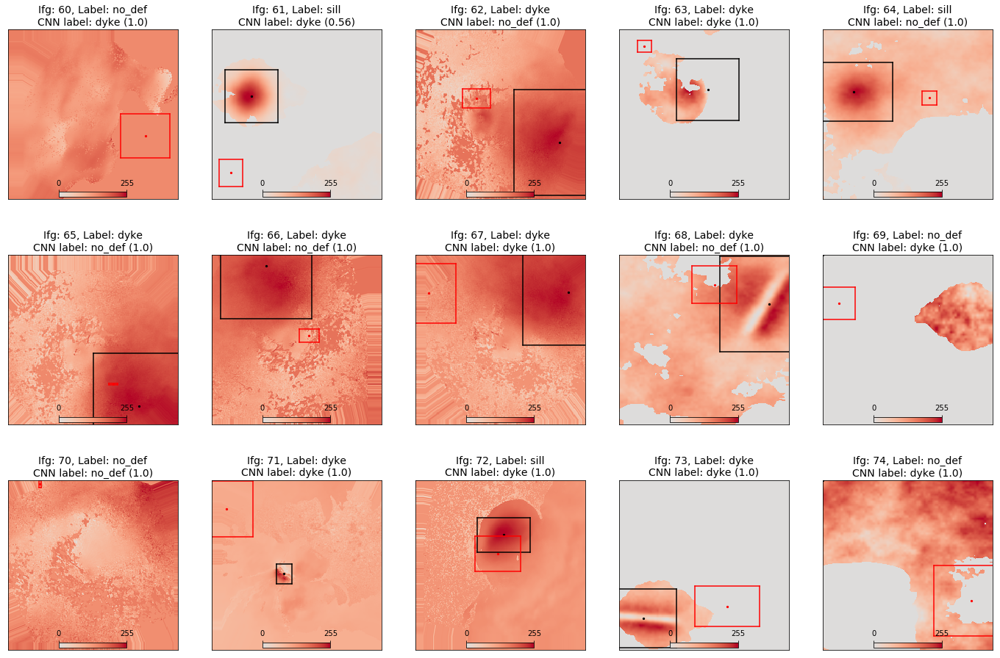

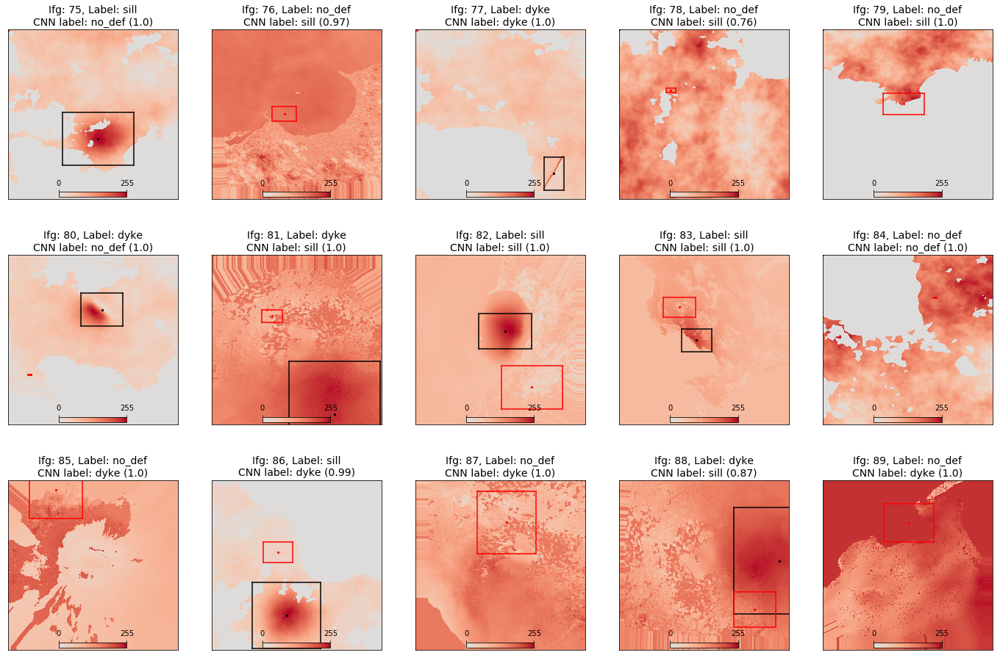

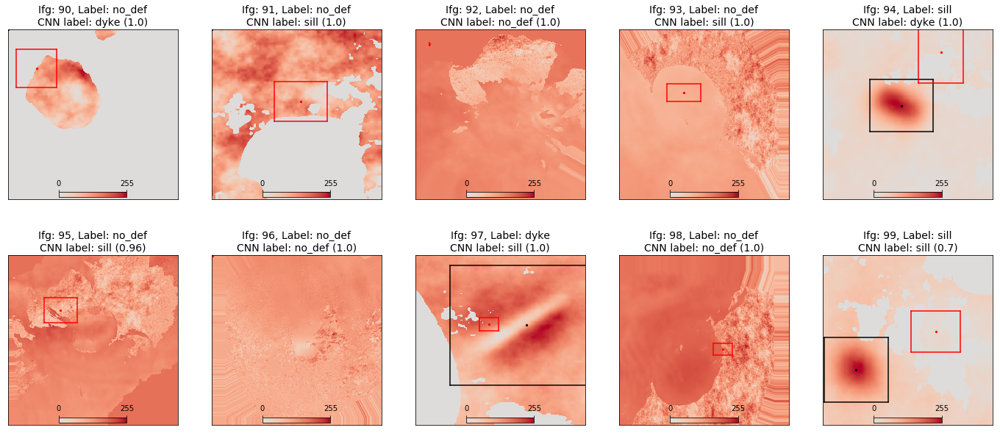

In [25]:
plot_data_class_loc_caller(X_test, classes = Y_class_test, classes_predicted = Y_class_test_cnn,       
                           # plot all the testing data
                           locs = Y_loc_test, locs_predicted = Y_loc_test_cnn, 
                           source_names = synthetic_ifgs_settings['defo_sources'], 
                           window_title = 'Testing data')

<div style="background-color: #ccffcc; padding: 10px;">

<h1> Fine Tuning </h1>
    
The model performs reasonably well but the above plot shows it could do with some fine-tuning

1. The model’s overall loss is now a combination of the classification and localisation loss, which must be balanced using a hyperparameter commonly termed loss weighting. Experimenting with this found that a  value of  0.95  for the classification loss and  0.05  for the localisation loss provided a  good balance between the two outputs as the localisation loss is significantly larger than the classification loss.
    
```python
block5_loss_weights = [0.05, 0.95] 
```

2. As a new style of training is occurring after the 10th epoch the learning rate needs to be carefully selected (too quick and the fine-tuning in both the  convolutional  blocks  of  VGG16 and  our  fully  connected  classification and localisation heads can get destroyed
     
    
```python
block5_lr = 1.0e-6  
```

3. Swithcing the optimizer to stochastic gradient descent (SGD)
```python
block5_optimiser = optimizers.SGD(lr=block5_lr, momentum=0.9) 
```
</div>



<hr>

<div style="background-color: #ffcdcc; padding: 10px;">    

**This might take a while**   

</div>

In [ ]:
# Fine-tune the 5th block and the fully connected part of the network):

# as per fc_loss_weights, but by changing these more emphasis can be placed on either the clasification 
# or localisation loss.  
block5_loss_weights = [0.05, 0.95]  

# We have to set a learning rate manually as an adaptive approach (e.g. NADAM) will be high initially,
# and therefore make large updates that will wreck the model (as we're just fine-tuning a model so have 
# something good to start with)
block5_lr = 1.5e-8 

# the number of epochs to fine-tune for 
# (ie. the number of times all the training data are passed through the model)
n_epochs_block5 = 10                
   
np.random.seed(0)                   # 0 used in the example
              
#%% Fine-tune the 5th convolutional block and the fully connected network.  

# VGG16 is used for its convolutional layers and weights (but no fully connected part as we define out own )
vgg16_block_1to5 = VGG16(weights='imagenet', include_top=False, input_shape = (224,224,3))  
# build the fully connected part of the model, and get the two model outputs
output_class, output_loc = define_two_head_model(vgg16_block_1to5.output,
                                                 len(synthetic_ifgs_settings['defo_sources']))        


vgg16_2head = Model(inputs=vgg16_block_1to5.input, outputs=[output_class, output_loc])                                           # define the full model
vgg16_2head.load_weights(f'data/train_fully_connected_model/vgg16_2head_fc.h5', by_name = True)                               # load the weights for the fully connected part which were trained in step 06 (by_name flag so that it doesn't matter that the models are different sizes))

for layer in vgg16_2head.layers[:15]:                                                                                             # freeze blocks 1-4 (ie, we are only fine tuneing the 5th block and the fully connected part of the network)
    layer.trainable = False    

                                      
# set the optimizer used in this training part. 
# Note have to set a learning rate manualy as an adaptive one (eg Nadam) 
# would wreck model weights in the first few passes before it reduced.         
block5_optimiser = optimizers.SGD(lr=block5_lr, momentum=0.9)   
 
vgg16_2head.compile(optimizer = block5_optimiser, metrics=['accuracy'],    
                    # recompile as we've changed which layers can be trained/ optimizer etc.  
                    loss=[loss_class, loss_loc], loss_weights = block5_loss_weights)                                  

try:
    plot_model(vgg16_2head, to_file='vgg16_2head.png', show_shapes = True, show_layer_names = True)    
    # try to make a graphviz style image showing the complete model 
except:
    print(f"Failed to create a .png of the model, but continuing anyway.  ")   
    vgg16_2head_fc.summary()
    # this can easily fail, however, so simply alert the user and continue.  


print('\n\nFine-tuning the 5th convolutional block and the fully connected network.')

[vgg16_2head, metrics_class_5th,
 metrics_localisation_5th, metrics_combined_loss_5th] = train_double_network(vgg16_2head, data_files_train,
                                                      n_epochs_block5, ['class_dense3_loss', 'loc_dense6_loss'],
                                                      X_validate, Y_class_validate, Y_loc_validate, 
                                                      len(synthetic_ifgs_settings['defo_sources']))
custom_training_history(metrics_class_5th, n_epochs_block5, title = '5th block classification training')
custom_training_history(metrics_localisation_5th, n_epochs_block5, title = '5th block localisation training')
try:
    os.mkdir((Path(f"./data/train_full_model")))
except:
    pass 
vgg16_2head.save(f'data/train_full_model/01_vgg16_2head_block5_trained.h5')
np.savez(f'data/train_full_model/training_history.npz', metrics_class_fc = metrics_class_fc,
                                                         metrics_localisation_fc = metrics_localisation_fc,
                                                         metrics_combined_loss_fc = metrics_combined_loss_fc,
                                                         metrics_class_5th = metrics_class_5th,
                                                         metrics_localisation_5th = metrics_localisation_5th,
                                                         metrics_combined_loss_5th = metrics_combined_loss_5th)







Fine-tuning the 5th convolutional block and the fully connected network.
Epoch 0, file 0: Loss = 236.0, Class. loss = 0.21, Class. acc. = 0.96, Loc. loss = 249.0
Epoch 0, file 1: Loss = 257.0, Class. loss = 0.0, Class. acc. = 1.0, Loc. loss = 271.0
Epoch 0, file 2: Loss = 268.0, Class. loss = 0.48, Class. acc. = 0.96, Loc. loss = 283.0
Epoch 0, file 3: Loss = 183.0, Class. loss = 0.06, Class. acc. = 0.96, Loc. loss = 193.0
Epoch 0, file 4: Loss = 192.0, Class. loss = 0.0, Class. acc. = 1.0, Loc. loss = 202.0
Epoch 0, file 5: Loss = 180.0, Class. loss = 0.07, Class. acc. = 0.96, Loc. loss = 189.0
Epoch 0, file 6: Loss = 953.0, Class. loss = 1.81, Class. acc. = 0.82, Loc. loss = 1003.0
Epoch 0, file 7: Loss = 754.0, Class. loss = 1.29, Class. acc. = 0.8, Loc. loss = 794.0
Epoch 0, file 8: Loss = 707.0, Class. loss = 2.0, Class. acc. = 0.8, Loc. loss = 744.0
Epoch 0, file 9: Loss = 1346.0, Class. loss = 1.49, Class. acc. = 0.84, Loc. loss = 1417.0
Epoch 0, file 10: Loss = 260.0, Class. 

Epoch 4, file 0: Loss = 219.0, Class. loss = 0.0, Class. acc. = 1.0, Loc. loss = 231.0
Epoch 4, file 1: Loss = 221.0, Class. loss = 0.16, Class. acc. = 0.96, Loc. loss = 232.0
Epoch 4, file 2: Loss = 216.0, Class. loss = 0.39, Class. acc. = 0.96, Loc. loss = 228.0
Epoch 4, file 3: Loss = 140.0, Class. loss = 0.01, Class. acc. = 1.0, Loc. loss = 147.0
Epoch 4, file 4: Loss = 144.0, Class. loss = 0.0, Class. acc. = 1.0, Loc. loss = 151.0
Epoch 4, file 5: Loss = 140.0, Class. loss = 0.2, Class. acc. = 0.96, Loc. loss = 148.0
Epoch 4, file 6: Loss = 832.0, Class. loss = 1.71, Class. acc. = 0.72, Loc. loss = 875.0
Epoch 4, file 7: Loss = 530.0, Class. loss = 1.23, Class. acc. = 0.82, Loc. loss = 558.0
Epoch 4, file 8: Loss = 427.0, Class. loss = 1.58, Class. acc. = 0.8, Loc. loss = 449.0
Epoch 4, file 9: Loss = 1137.0, Class. loss = 1.73, Class. acc. = 0.82, Loc. loss = 1197.0
Epoch 4, file 10: Loss = 171.0, Class. loss = 0.36, Class. acc. = 0.98, Loc. loss = 180.0
Epoch 4, file 11: Loss = 

<div style="background-color: #ccffcc; padding: 10px;">

<h1> Plot the results of the fine tuned model  </h1>


    
</div>

In [ ]:
#%% Test with synthetic and real data

print('\n Forward pass of the testing data through the network:')

Y_class_test_cnn, Y_loc_test_cnn = vgg16_2head.predict(X_test[:,:,:,:], verbose = 1)                                    # predict class labels


plot_data_class_loc_caller(X_test, classes = Y_class_test, classes_predicted = Y_class_test_cnn,                    # plot all the testing data
                           locs = Y_loc_test, locs_predicted = Y_loc_test_cnn, 
                           source_names = synthetic_ifgs_settings['defo_sources'], 
                           window_title = 'Testing data (after fine tuning)')